try 2d

[ Info: Saved animation to d:\OneDrive - UGM 365\Semester Gasal 2023-2024\Fisika Komputasi\eldin-wave\EM fdtd_2d-leap.gif


Plots.AnimatedGif("d:\\OneDrive - UGM 365\\Semester Gasal 2023-2024\\Fisika Komputasi\\eldin-wave\\EM fdtd_2d-leap.gif")
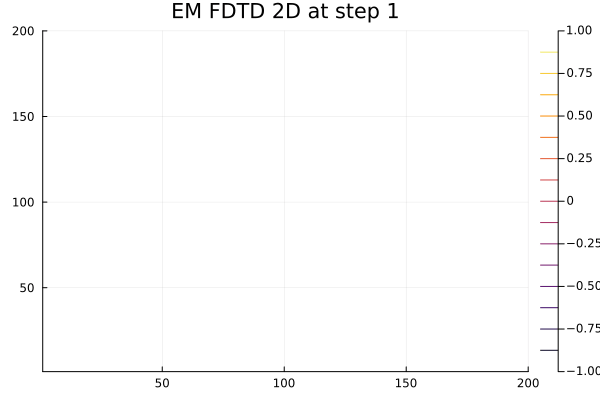

In [3]:
# Import necessary packages
using Plots

# Constants
ε0 = 8.854187817e-12  # Permittivity of free space
μ0 = 1.256637061e-6   # Permeability of free space
c = 1 / sqrt(μ0 * ε0) # Speed of light in vacuum
Δx = 1e-3             # Spatial step (1mm)
Δt = Δx / (2 * c)     # Time step (satisfies Courant condition)

# Domain
grid_size = 200           # Number of spatial steps
Ez = zeros(grid_size, grid_size)      # Electric field
Hx = zeros(grid_size, grid_size)      # Magnetic field
Hy = zeros(grid_size, grid_size)      # Magnetic field

# Source
source_position = Int(grid_size / 4)  # Position of the source in the grid
source_frequency = 2.5e9         # Frequency of the source (2.5 GHz)
ω = 2 * π * source_frequency     # Angular frequency

# Time stepping
time_steps = 1000  # Total number of time steps to simulate

# Initialize animation
anim = Animation()

# FDTD loop
for n = 1:time_steps
    # Update electric field
    for i = 2:grid_size-1
        for j = 2:grid_size-1
            Ez[i, j] += Δt / ε0 * ((Hy[i, j] - Hy[i-1, j]) / Δx - (Hx[i, j] - Hx[i, j-1]) / Δx)
        end
    end

    # Update magnetic field
    for i = 2:grid_size-1
        for j = 2:grid_size-1
            Hx[i, j] -= Δt / μ0 * (Ez[i, j+1] - Ez[i, j]) / Δx
            Hy[i, j] += Δt / μ0 * (Ez[i+1, j] - Ez[i, j]) / Δx
        end
    end

    # Source (a hard source)
    Ez[source_position, source_position] += sin(ω * (n) * Δt)

    # Visualization/plotting at certain time steps
    # if n % 50 == 0
    p = contour(Ez, label="Electric Field", clim=(-1, 1))
    plot!(title="EM FDTD 2D at step $n")
    frame(anim, p)
    # end
end

# Save the animation as a GIF
gif(anim, "EM fdtd_2d-leap.gif", fps=20)
